In [2]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter,LatitudeFormatter
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import cmap
import cartopy.feature as cFeature

## Load climate index variables for specified area and model run

In [ ]:
# Define dataset specifics

model_scenario_name = 'MRI-ESM2-0_ssp245' # Choose a model and SSP scenario
area_name = 'europe' # Choose an area
data_folder = '../CMIP6_data/' # Folder where downloaded CMIP6 data is stored

# Defines start and end of time slice by picking 20 years before and 20 years after abrupt SPG cooling
if model_scenario_name == 'NorESM2-LM_ssp126':
    start_time = '2015-01-01'; end_time = '2054-12-31'
    cooling_year = '2035-01-01'
    time_array = np.arange(2015, 2055, 1)
elif model_scenario_name == 'NorESM2-LM_ssp245':
    start_time = '2015-01-01'; end_time = '2054-12-31'
    cooling_year = '2035-01-01'
    time_array = np.arange(2015, 2055, 1)
elif model_scenario_name == 'CESM2-WACCM_ssp126':
    start_time = '2020-01-01'; end_time = '2059-12-31'
    cooling_year = '2040-01-01'
    time_array = np.arange(2020, 2060, 1)
elif model_scenario_name == 'CESM2-WACCM_ssp245':
    start_time = '2020-01-01'; end_time = '2059-12-31'
    cooling_year = '2040-01-01'
    time_array = np.arange(2020, 2060, 1)
elif model_scenario_name == 'MRI-ESM2-0_ssp245':
    start_time = '2020-01-01'; end_time = '2059-12-31'
    cooling_year = '2040-01-01'
    time_array = np.arange(2020, 2060, 1)
elif model_scenario_name == 'UKESM1-0-LL':
    start_time = '2020-01-01'; end_time = '2059-12-31'
    cooling_year = '2040-01-01'
    time_array = np.arange(2020, 2060, 1)
elif model_scenario_name == 'MPI-ESM1-2-LR':
    start_time = '2020-01-01'; end_time = '2059-12-31'
    cooling_year = '2040-01-01'
    time_array = np.arange(2020, 2060, 1)
elif model_scenario_name == 'GFDL-ESM4':
    start_time = '2020-01-01'; end_time = '2059-12-31'
    cooling_year = '2040-01-01'
    time_array = np.arange(2020, 2060, 1)
else:
    print("This dataset is not considered in the current study, but can be added to the analysis")

if area_name == 'norway':
    southern_lat = 57; northern_lat = 72
    western_lon = 2.5; eastern_lon = 33
elif area_name == 'germany':
    southern_lat = 46.5; northern_lat = 55.5
    western_lon = 5; eastern_lon = 15
elif area_name == 'europe':
    southern_lat = 35; northern_lat = 72
    western_lon = 310; eastern_lon = 33  
elif area_name == 'global':
    southern_lat = -90; northern_lat = 90
    western_lon = 0; eastern_lon = 360
else:
    print("This area is not predefined in the current study, but can be added to the analysis")

# Load mean daily temperature data

files = glob.glob(data_folder+'tas_day_'+model_scenario_name+'*')
files.sort()
tas = xr.open_mfdataset(files)

if area_name == 'europe':
    temp1 = tas.tas.sel(lat=slice(southern_lat, northern_lat), 
                        lon=slice(western_lon, 360), 
                        time=slice(start_time, end_time))
    temp2 = tas.tas.sel(lat=slice(southern_lat, northern_lat), 
                        lon=slice(0, eastern_lon), 
                        time=slice(start_time, end_time))

    temp = xr.concat([temp1, temp2], dim='lon')
else:
    temp = tas.tas.sel(lat=slice(southern_lat, northern_lat), 
                        lon=slice(western_lon, eastern_lon), 
                        time=slice(start_time, end_time))
temp.load()

# Load daily precipitation flux

files = glob.glob(data_folder+'pr_day_'+model_scenario_name+'*')
files.sort()
pr = xr.open_mfdataset(files)

if area_name == 'europe':
    precip1 = pr.sel(lat=slice(southern_lat, northern_lat), 
                        lon=slice(western_lon, 360), 
                        time=slice(start_time, end_time))
    precip2 = pr.sel(lat=slice(southern_lat, northern_lat), 
                        lon=slice(0, eastern_lon), 
                        time=slice(start_time, end_time))

    precip = xr.concat([precip1, precip2], dim='lon')
else:
    precip = pr.sel(lat=slice(southern_lat, northern_lat), 
                        lon=slice(western_lon, eastern_lon), 
                        time=slice(start_time, end_time))

# Convert precipitation flux from kg/m2/s to daily amount --> mm/day

precip['pr'].values = precip.pr.values * 24*60*60
precip = precip.pr
precip = precip.assign_attrs(units = 'mm/day')


## Plot annual mean changes of temperature and precipitation

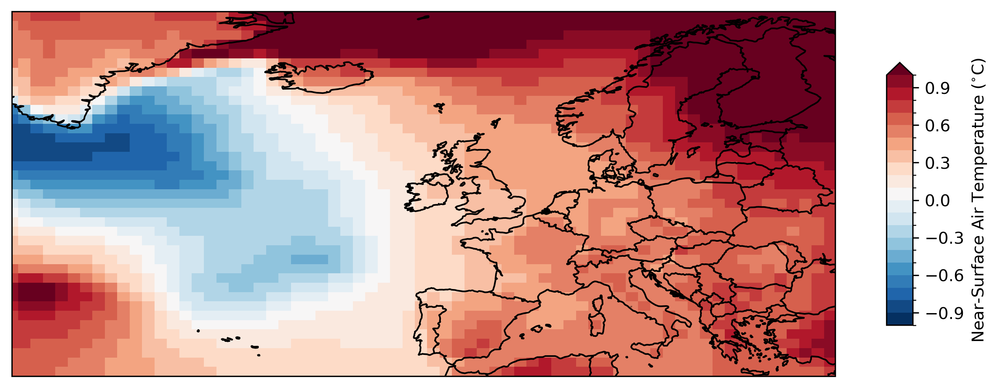

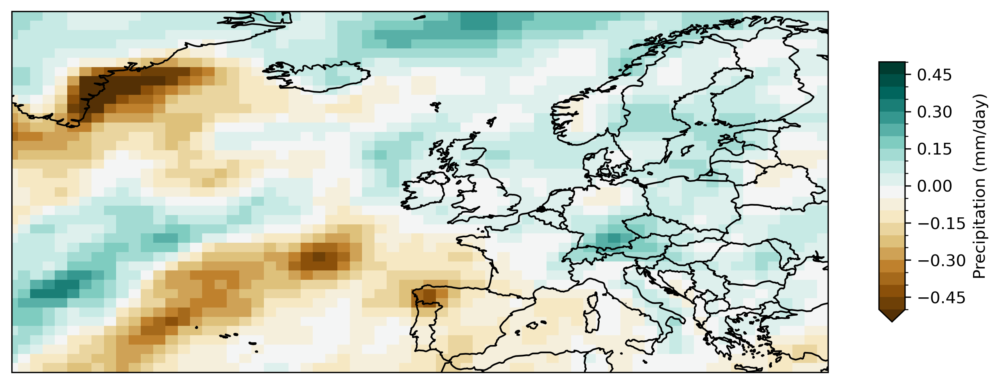

In [ ]:
save_folder = '../figures/temp_precip/' # Folder where climate indices should be saved
os.makedirs(save_folder, exist_ok=True) 

# Divide into pre and post cooling periods

temp_pre = temp.sel(time=slice(start_time, cooling_year)).mean('time')
temp_post = temp.sel(time=slice(cooling_year, end_time)).mean('time')

pr_pre = precip.sel(time=slice(start_time, cooling_year)).mean('time')
pr_post = precip.sel(time=slice(cooling_year, end_time)).mean('time')

lmax_tas = 1
lmax_pr = 0.5

    
# Plot temperature
levels = np.linspace(-lmax_tas, lmax_tas, 21)
fig = plt.figure(figsize=[9, 4], dpi=300)
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
diff = temp_post - temp_pre
if area_name == 'europe':
    diff = diff.reindex({'lon':pr.lon})
    ax.set_xlim([-50, 33])

map = diff.plot(ax=ax, 
            transform=ccrs.PlateCarree(),levels=levels, cmap='RdBu_r',
            cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':temp.long_name +' ($^{\circ}$C)'})
ax.coastlines()
ax.add_feature(cFeature.BORDERS)
ax.set_title('')
fig.tight_layout()
plt.savefig(save_folder+'tas_'+area_name+'_'+model_scenario_name+'.png')
plt.show()

# Plot precipitation
levels = np.linspace(-lmax_pr, lmax_pr, 21)
fig = plt.figure(figsize=[9, 4], dpi=300)
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
diff = pr_post - pr_pre
if area_name == 'europe':
    diff = diff.reindex({'lon':pr.lon})
    ax.set_xlim([-50, 33])

map = diff.plot(ax=ax, 
            transform=ccrs.PlateCarree(),levels=levels, cmap='BrBG',
            cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':precip.long_name +' ('+precip.units+')'})
ax.coastlines()
ax.add_feature(cFeature.BORDERS)
ax.set_title('')
fig.tight_layout()
plt.savefig(save_folder+'pr_'+area_name+'_'+model_scenario_name+'.png')
plt.show()

## Plot minimum yearly mean vs. minimum yearly mean

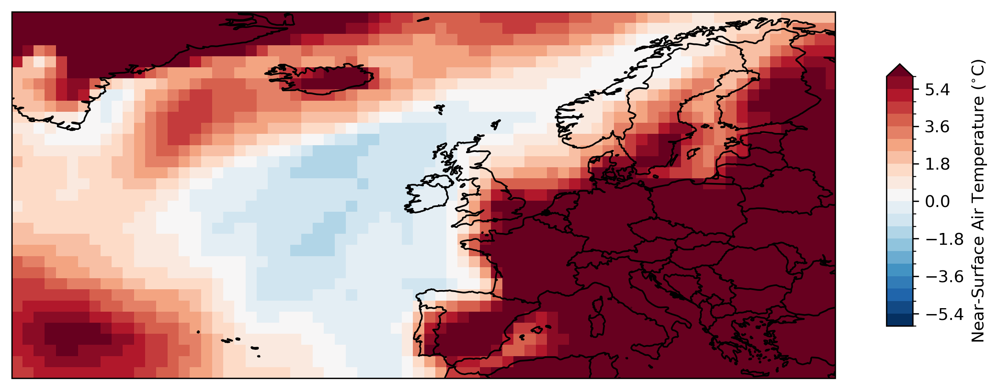

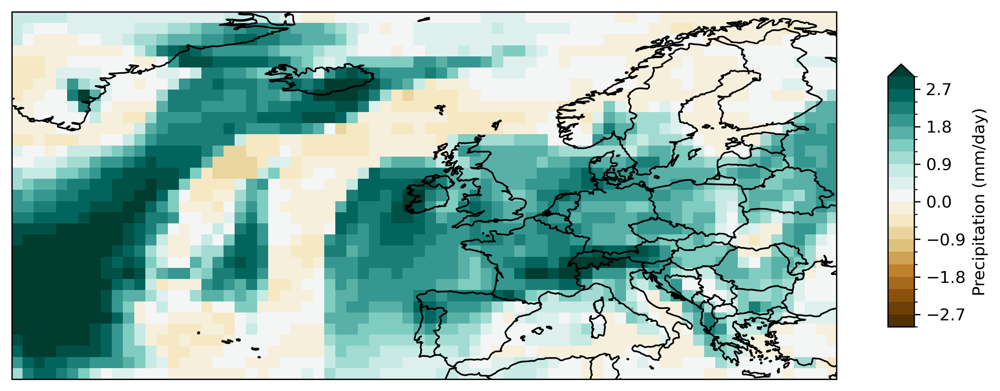

In [ ]:
save_folder = '../figures/temp_precip/' # Folder where climate indices should be saved
os.makedirs(save_folder, exist_ok=True) 

# Divide into pre and post cooling periods

temp_pre = temp.sel(time=slice(start_time, cooling_year)).groupby('time.year').mean('time').min('year')
temp_post = temp.sel(time=slice(cooling_year, end_time)).groupby('time.year').mean('time').min('year')

pr_pre = precip.sel(time=slice(start_time, cooling_year)).groupby('time.year').mean('time').min('year')
pr_post = precip.sel(time=slice(cooling_year, end_time)).groupby('time.year').mean('time').min('year')

lmax_tas = 6
lmax_pr = 3
    
# Plot temperature
levels = np.linspace(-lmax_tas, lmax_tas, 21)
fig = plt.figure(figsize=[9, 4], dpi=300)
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
diff = temp_post - temp_pre
if area_name == 'europe':
    diff = diff.reindex({'lon':pr.lon})
    ax.set_xlim([-50, 33])

map = diff.plot(ax=ax, 
            transform=ccrs.PlateCarree(),levels=levels, cmap='RdBu_r',
            cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':temp.long_name +' ($^{\circ}$C)'})
ax.coastlines()
ax.add_feature(cFeature.BORDERS)
ax.set_title('')
fig.tight_layout()
plt.savefig(save_folder+'tas_min_'+area_name+'_'+model_scenario_name+'.png')
plt.show()

# Plot precipitation
levels = np.linspace(-lmax_pr, lmax_pr, 21)
fig = plt.figure(figsize=[9, 4], dpi=300)
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
diff = pr_post - pr_pre
if area_name == 'europe':
    diff = diff.reindex({'lon':pr.lon})
    ax.set_xlim([-50, 33])

map = diff.plot(ax=ax, 
            transform=ccrs.PlateCarree(),levels=levels, cmap='BrBG',
            cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':precip.long_name +' ('+precip.units+')'})
ax.coastlines()
ax.add_feature(cFeature.BORDERS)
ax.set_title('')
fig.tight_layout()
plt.savefig(save_folder+'pr_min_'+area_name+'_'+model_scenario_name+'.png')
plt.show()

## Plot maximum yearly mean vs. maximum yearly mean

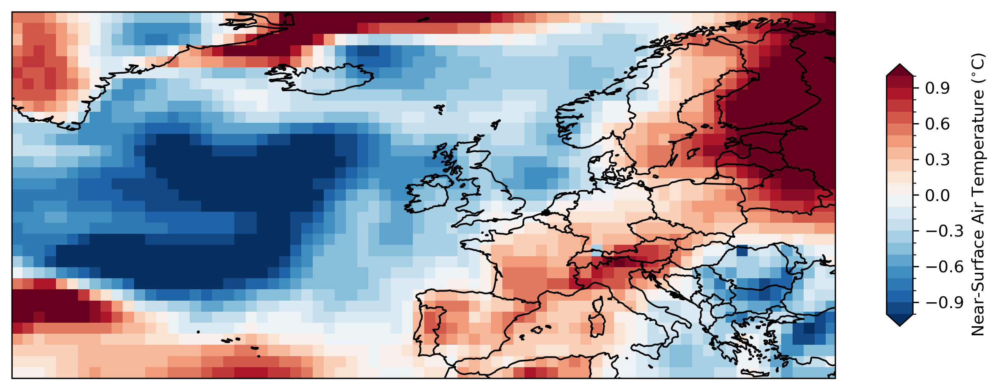

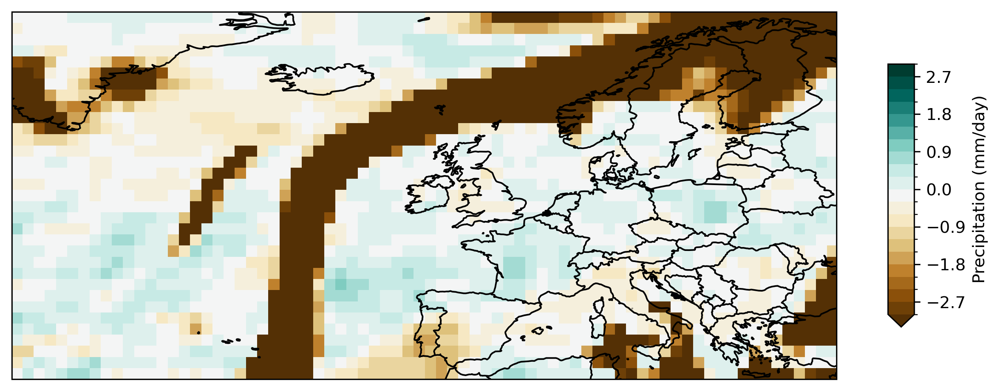

In [ ]:
save_folder = '../figures/temp_precip/' # Folder where climate indices should be saved
os.makedirs(save_folder, exist_ok=True) 

# Divide into pre and post cooling periods

temp_pre = temp.sel(time=slice(start_time, cooling_year)).groupby('time.year').mean('time').max('year')
temp_post = temp.sel(time=slice(cooling_year, end_time)).groupby('time.year').mean('time').max('year')

pr_pre = precip.sel(time=slice(start_time, cooling_year)).groupby('time.year').mean('time').max('year')
pr_post = precip.sel(time=slice(cooling_year, end_time)).groupby('time.year').mean('time').max('year')

lmax_tas = 1
lmax_pr = 3

# Plotting

    
# Plot temperature
levels = np.linspace(-lmax_tas, lmax_tas, 21)
fig = plt.figure(figsize=[9, 4], dpi=300)
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
diff = temp_post - temp_pre
if area_name == 'europe':
    diff = diff.reindex({'lon':pr.lon})
    ax.set_xlim([-50, 33])

map = diff.plot(ax=ax, 
            transform=ccrs.PlateCarree(),levels=levels, cmap='RdBu_r',
            cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':temp.long_name +' ($^{\circ}$C)'})
ax.coastlines()
ax.add_feature(cFeature.BORDERS)
ax.set_title('')
fig.tight_layout()
plt.savefig(save_folder+'tas_max_'+area_name+'_'+model_scenario_name+'.png')
plt.show()

# Plot precipitation
levels = np.linspace(-lmax_pr, lmax_pr, 21)
fig = plt.figure(figsize=[9, 4], dpi=300)
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
diff = pr_post - pr_pre
if area_name == 'europe':
    diff = diff.reindex({'lon':pr.lon})
    ax.set_xlim([-50, 33])

map = diff.plot(ax=ax, 
            transform=ccrs.PlateCarree(),levels=levels, cmap='BrBG',
            cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':precip.long_name +' ('+precip.units+')'})
ax.coastlines()
ax.add_feature(cFeature.BORDERS)
ax.set_title('')
fig.tight_layout()
plt.savefig(save_folder+'pr_max_'+area_name+'_'+model_scenario_name+'.png')
plt.show()

## Plot seasonal maps of changes in temperature and precipitation

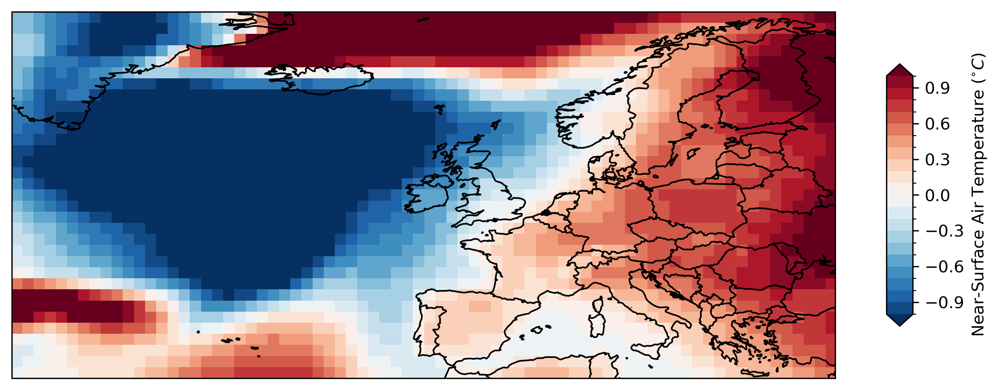

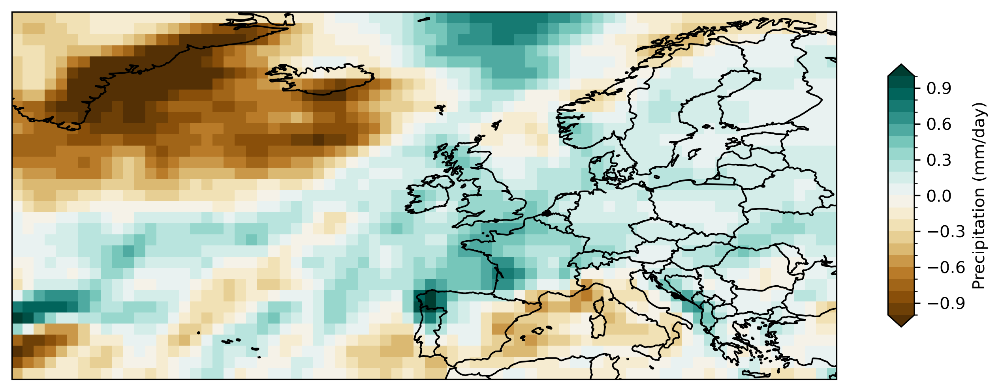

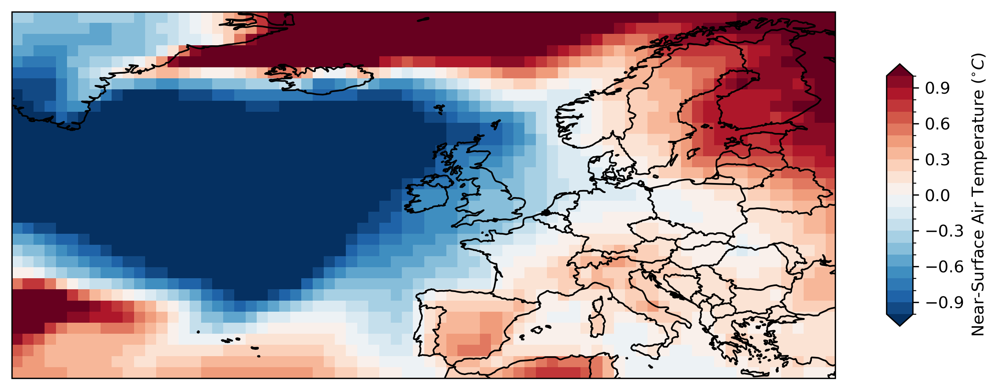

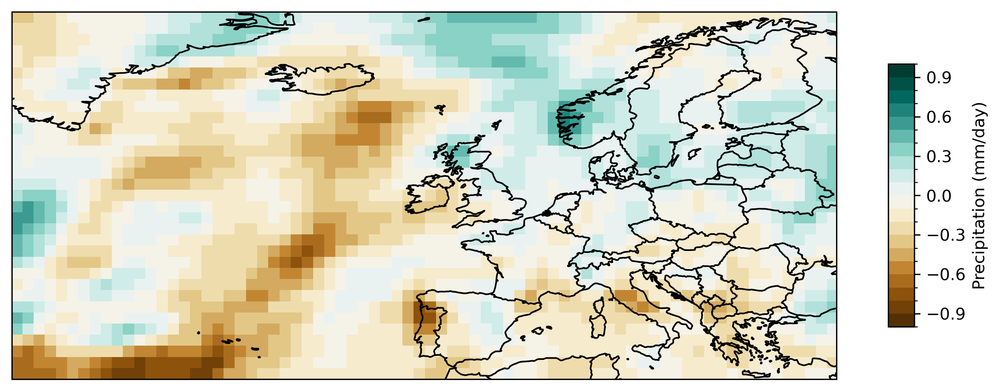

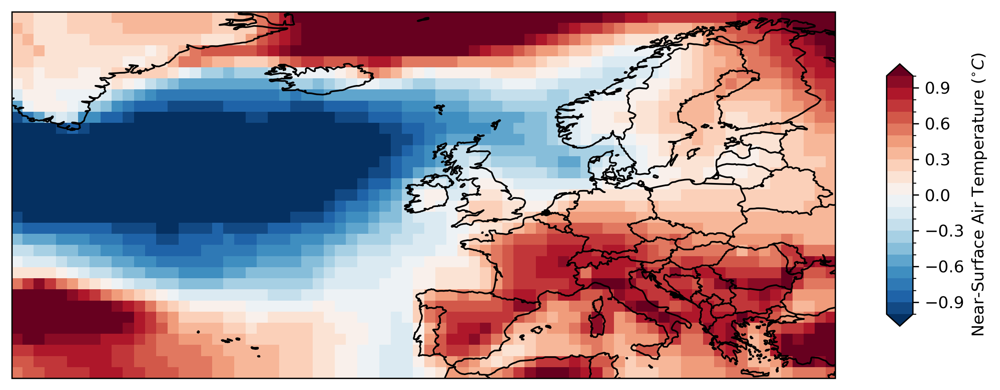

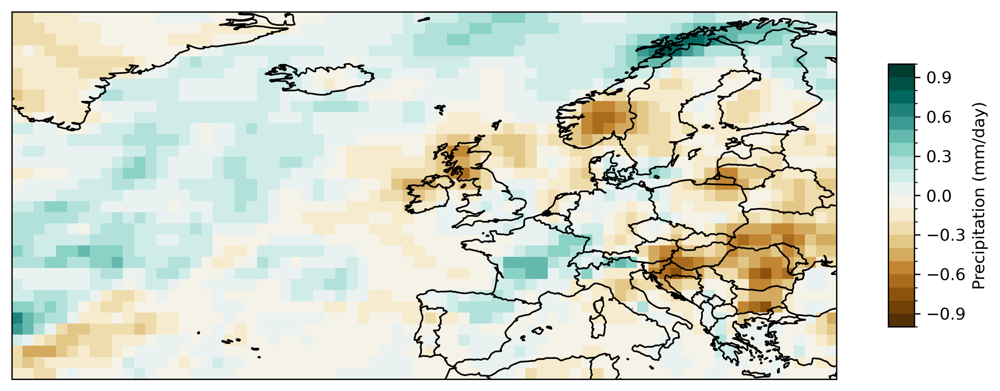

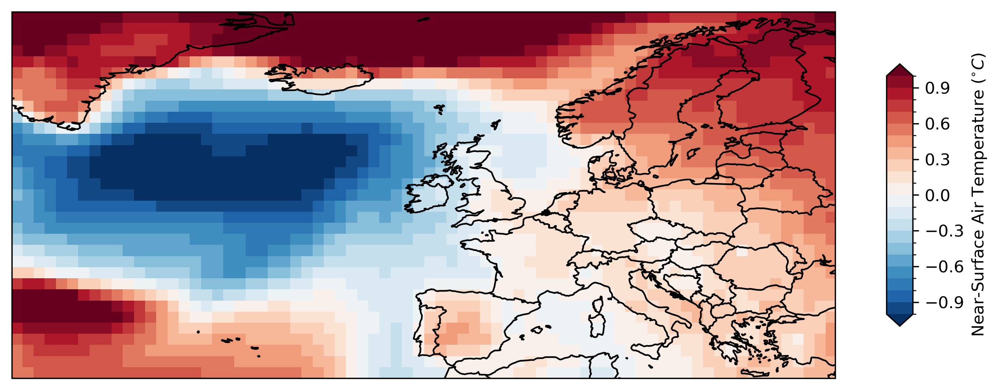

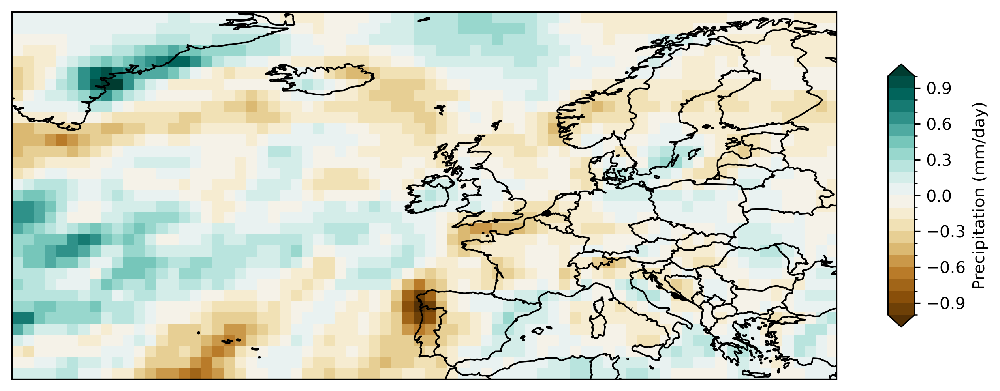

In [ ]:
save_folder = '../figures/seasonal_temp_precip/' # Folder where climate indices should be saved
os.makedirs(save_folder, exist_ok=True) 

# Divide into pre and post cooling periods

temp_pre = temp.sel(time=slice(start_time, cooling_year))
temp_post = temp.sel(time=slice(cooling_year, end_time))
temp_pre_seasons = temp_pre.groupby('time.season').mean('time')
temp_post_seasons = temp_post.groupby('time.season').mean('time')

pr_pre = precip.sel(time=slice(start_time, cooling_year))
pr_post = precip.sel(time=slice(cooling_year, end_time))
pr_pre_seasons = pr_pre.groupby('time.season').mean('time')
pr_post_seasons = pr_post.groupby('time.season').mean('time')

seasons = ['DJF', 'MAM', 'JJA', 'SON']
lmax_tas = 1
lmax_pr = 1

# Plotting

for season in seasons:
    
    # Plot temperature
    levels = np.linspace(-lmax_tas, lmax_tas, 21)
    fig = plt.figure(figsize=[9, 4], dpi=300)
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    diff = temp_post_seasons.sel(season=season)- temp_pre_seasons.sel(season=season)
    if area_name == 'europe':
        diff = diff.reindex({'lon':pr.lon})
        ax.set_xlim([-50, 33])

    map = diff.plot(ax=ax, 
                transform=ccrs.PlateCarree(),levels=levels, cmap='RdBu_r',
                cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':temp.long_name +' ($^{\circ}$C)'})
    ax.coastlines()
    ax.add_feature(cFeature.BORDERS)
    ax.set_title(season)
    fig.tight_layout()
    plt.savefig(save_folder+'tas_'+area_name+'_'+model_scenario_name+'_'+season+'.png')
    plt.show()

    # Plot precipitation
    levels = np.linspace(-lmax_pr, lmax_pr, 21)
    fig = plt.figure(figsize=[9, 4], dpi=300)
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    diff = pr_post_seasons.sel(season=season)- pr_pre_seasons.sel(season=season)
    if area_name == 'europe':
        diff = diff.reindex({'lon':pr.lon})
        ax.set_xlim([-50, 33])

    map = diff.plot(ax=ax, 
                transform=ccrs.PlateCarree(),levels=levels, cmap='BrBG',
                cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':precip.long_name +' ('+precip.units+')'})
    ax.coastlines()
    ax.add_feature(cFeature.BORDERS)
    ax.set_title(season)
    fig.tight_layout()
    plt.savefig(save_folder+'pr_'+area_name+'_'+model_scenario_name+'_'+season+'.png')
    plt.show()

## Plot variance

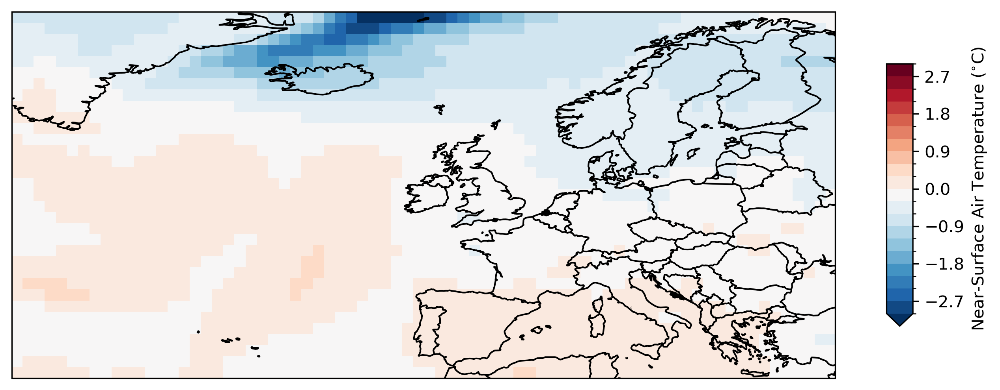

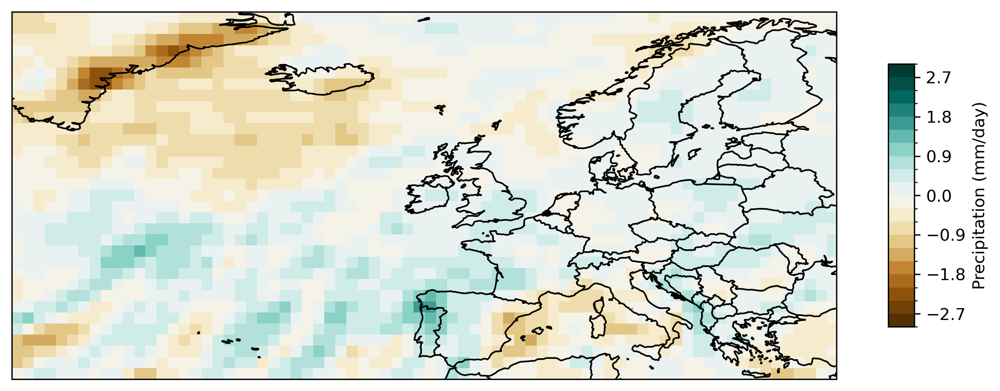

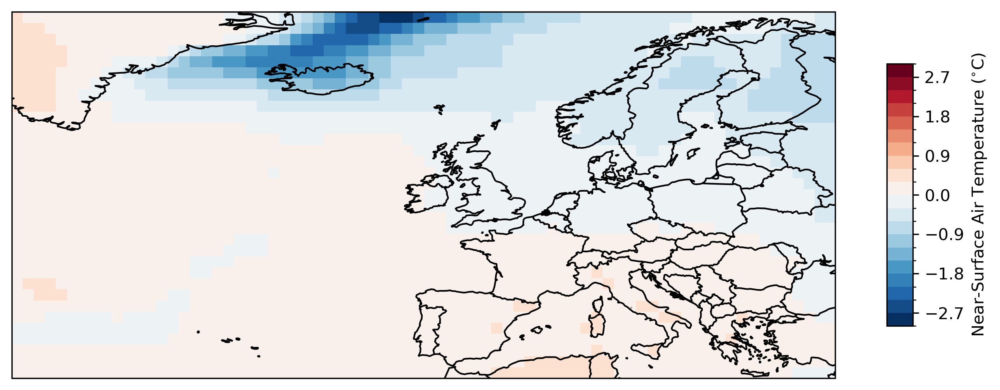

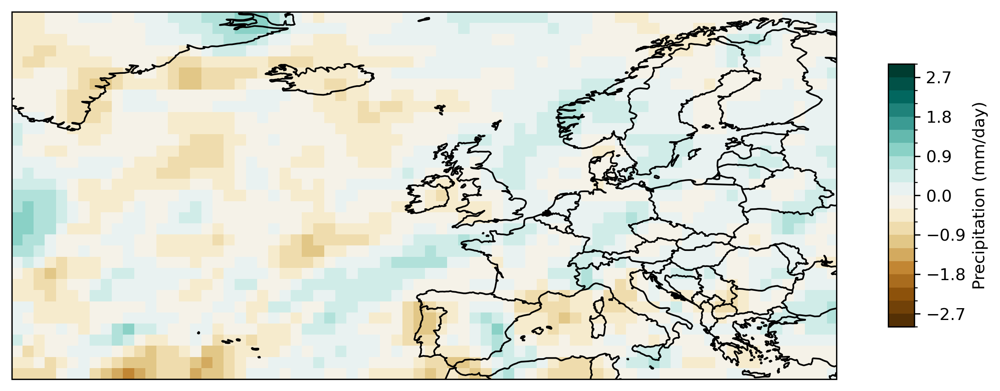

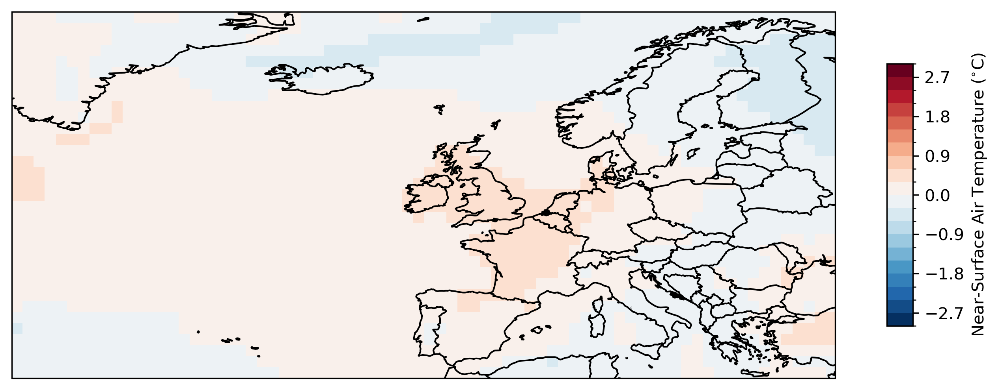

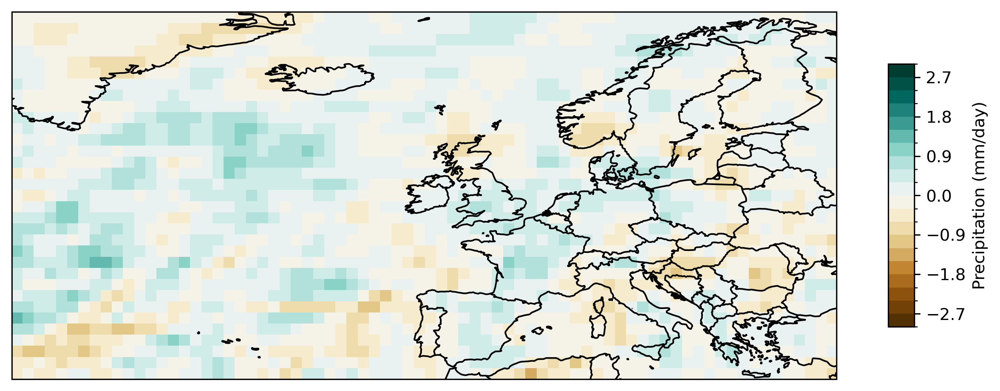

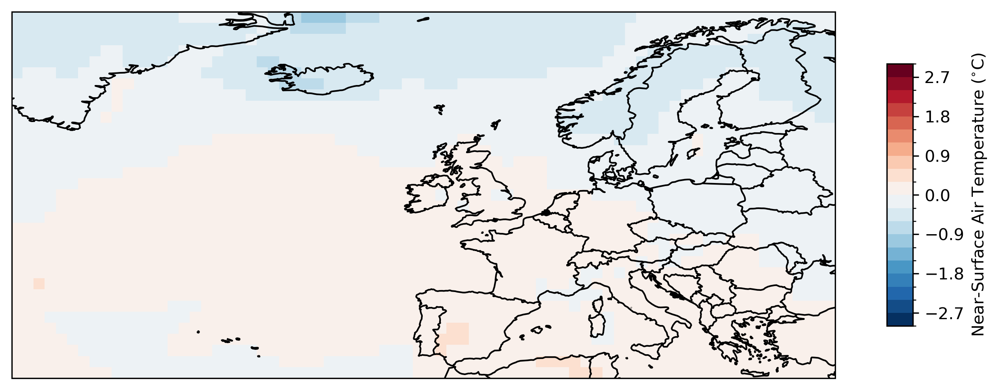

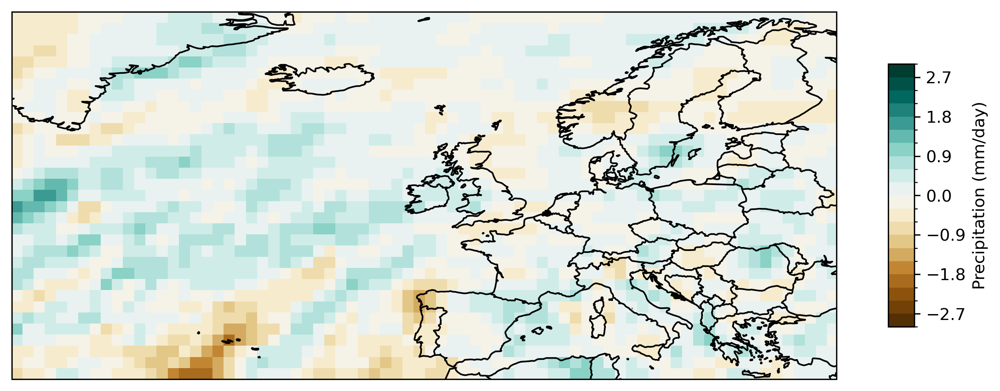

In [4]:
save_folder = '../figures/seasonal_temp_precip/' # Folder where climate indices should be saved
os.makedirs(save_folder, exist_ok=True) 

# Divide into pre and post cooling periods

temp_pre = temp.sel(time=slice(start_time, cooling_year))
temp_post = temp.sel(time=slice(cooling_year, end_time))
temp_pre_seasons = temp_pre.groupby('time.season').std('time')
temp_post_seasons = temp_post.groupby('time.season').std('time')

pr_pre = precip.sel(time=slice(start_time, cooling_year))
pr_post = precip.sel(time=slice(cooling_year, end_time))
pr_pre_seasons = pr_pre.groupby('time.season').std('time')
pr_post_seasons = pr_post.groupby('time.season').std('time')

seasons = ['DJF', 'MAM', 'JJA', 'SON']
lmax_tas = 3
lmax_pr = 3

# Plotting

for season in seasons:
    
    # Plot temperature
    levels = np.linspace(-lmax_tas, lmax_tas, 21)
    fig = plt.figure(figsize=[9, 4], dpi=300)
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    diff = temp_post_seasons.sel(season=season)- temp_pre_seasons.sel(season=season)
    if area_name == 'europe':
        diff = diff.reindex({'lon':pr.lon})
        ax.set_xlim([-50, 33])

    map = diff.plot(ax=ax, 
                transform=ccrs.PlateCarree(),levels=levels, cmap='RdBu_r',
                cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':temp.long_name +' ($^{\circ}$C)'})
    ax.coastlines()
    ax.add_feature(cFeature.BORDERS)
    ax.set_title('')
    fig.tight_layout()
    plt.savefig(save_folder+'var_tas_'+area_name+'_'+model_scenario_name+'_'+season+'.png')
    plt.show()

    # Plot precipitation
    levels = np.linspace(-lmax_pr, lmax_pr, 21)
    fig = plt.figure(figsize=[9, 4], dpi=300)
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    diff = pr_post_seasons.sel(season=season)- pr_pre_seasons.sel(season=season)
    if area_name == 'europe':
        diff = diff.reindex({'lon':pr.lon})
        ax.set_xlim([-50, 33])

    map = diff.plot(ax=ax, 
                transform=ccrs.PlateCarree(),levels=levels, cmap='BrBG',
                cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':precip.long_name +' ('+precip.units+')'})
    ax.coastlines()
    ax.add_feature(cFeature.BORDERS)
    ax.set_title('')
    fig.tight_layout()
    plt.savefig(save_folder+'var_pr_'+area_name+'_'+model_scenario_name+'_'+season+'.png')
    plt.show()

## Plot minimum year to minimum year

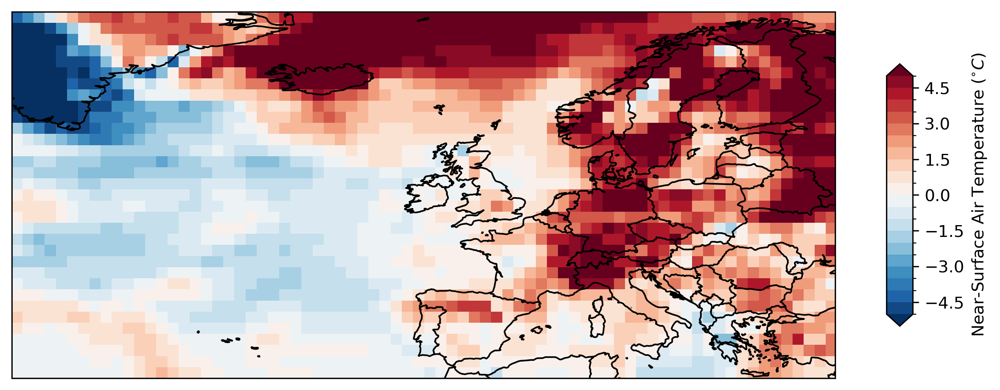

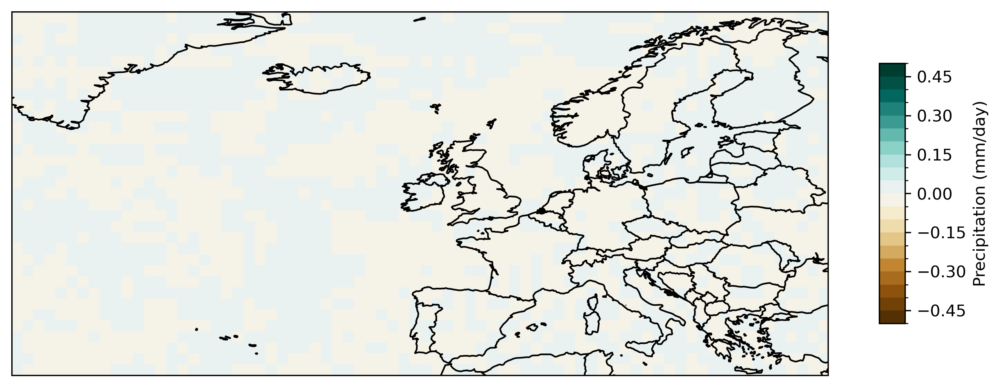

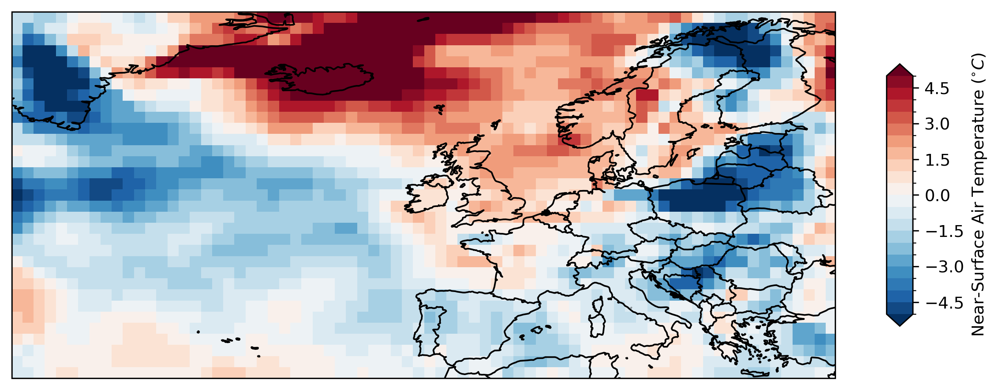

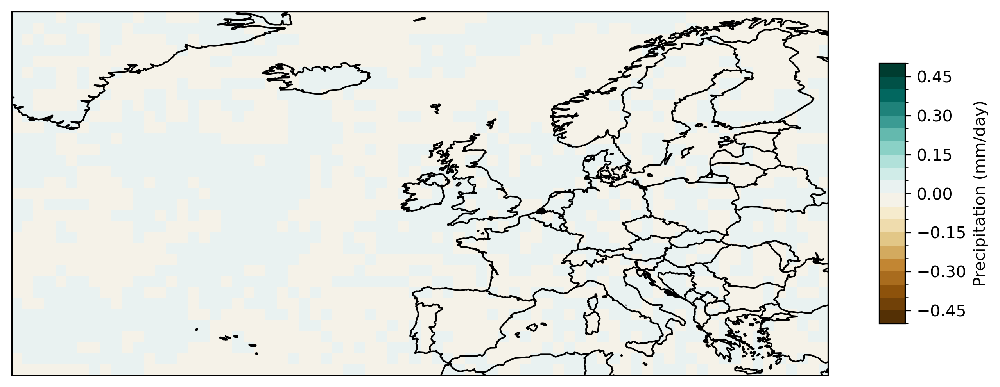

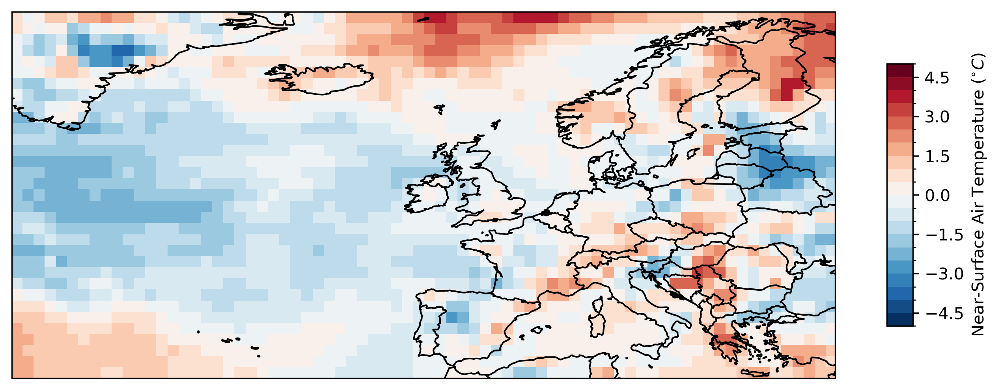

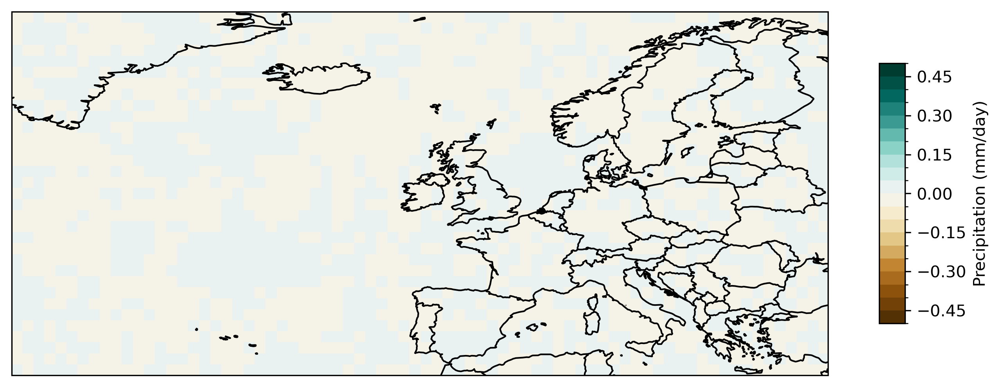

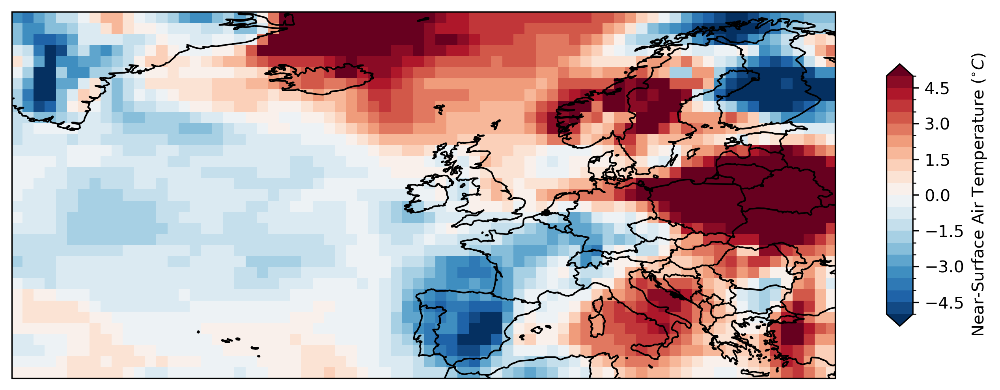

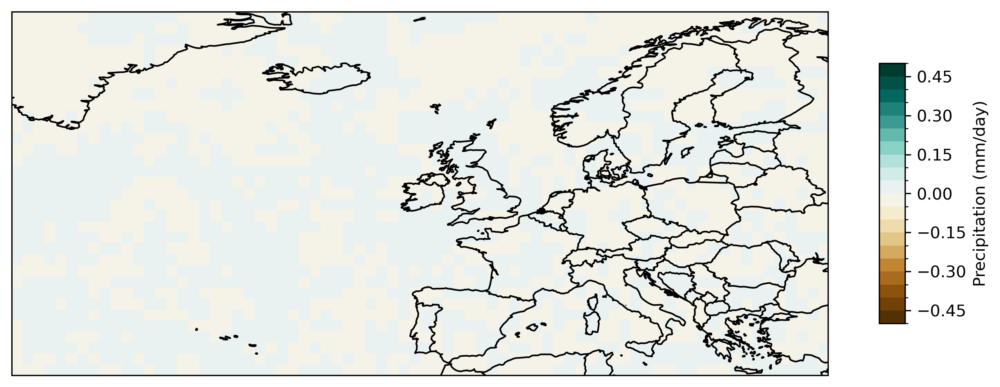

In [ ]:
save_folder = '../figures/seasonal_temp_precip/' # Folder where climate indices should be saved
os.makedirs(save_folder, exist_ok=True) 

# Divide into pre and post cooling periods

temp_pre = temp.sel(time=slice(start_time, cooling_year))
temp_post = temp.sel(time=slice(cooling_year, end_time))
temp_pre_seasons = temp_pre.groupby('time.season').min('time')
temp_post_seasons = temp_post.groupby('time.season').min('time')

pr_pre = precip.sel(time=slice(start_time, cooling_year))
pr_post = precip.sel(time=slice(cooling_year, end_time))
pr_pre_seasons = pr_pre.groupby('time.season').min('time')
pr_post_seasons = pr_post.groupby('time.season').min('time')

seasons = ['DJF', 'MAM', 'JJA', 'SON']
lmax_tas = 5
lmax_pr = 0.5

# Plotting

for season in seasons:
    
    # Plot temperature
    levels = np.linspace(-lmax_tas, lmax_tas, 21)
    fig = plt.figure(figsize=[9, 4], dpi=300)
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    diff = temp_post_seasons.sel(season=season)- temp_pre_seasons.sel(season=season)
    if area_name == 'europe':
        diff = diff.reindex({'lon':pr.lon})
        ax.set_xlim([-50, 33])

    map = diff.plot(ax=ax, 
                transform=ccrs.PlateCarree(),levels=levels, cmap='RdBu_r',
                cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':temp.long_name +' ($^{\circ}$C)'})
    ax.coastlines()
    ax.add_feature(cFeature.BORDERS)
    ax.set_title('')
    fig.tight_layout()
    plt.savefig(save_folder+'tas_min_'+area_name+'_'+model_scenario_name+'_'+season+'.png')
    plt.show()

    # Plot precipitation
    levels = np.linspace(-lmax_pr, lmax_pr, 21)
    fig = plt.figure(figsize=[9, 4], dpi=300)
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    ax = plt.subplot(1,1,1, projection=ccrs.PlateCarree())
    diff = pr_post_seasons.sel(season=season)- pr_pre_seasons.sel(season=season)
    if area_name == 'europe':
        diff = diff.reindex({'lon':pr.lon})
        ax.set_xlim([-50, 33])

    map = diff.plot(ax=ax, 
                transform=ccrs.PlateCarree(),levels=levels, cmap='BrBG',
                cbar_kwargs={'orientation':'vertical','shrink':0.6, 'aspect':10,'label':precip.long_name +' ('+precip.units+')'})
    ax.coastlines()
    ax.add_feature(cFeature.BORDERS)
    ax.set_title('')
    fig.tight_layout()
    plt.savefig(save_folder+'pr_min_'+area_name+'_'+model_scenario_name+'_'+season+'.png')
    plt.show()